In [2]:
"""
    Importeer libraries
    """
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import pandas as pd
from scipy.spatial import cKDTree
from math import sqrt, ceil
from scipy.stats import linregress    
import libraries as lib
import math 
import plotly.express as px
import plotly.graph_objects as go

    

In [3]:
"""
    Laadt motordriver-data in, selecteert een subset van rijen, corrigeert GPS-coördinaten
    en voegt snelheden in m/s toe.

    Parameters:
    directory (str): Pad naar de directory met het databestand.
    file_motordriver (str): Naam van het motordriver-databestand.
    start_row (int): Startindex van de te selecteren rijen (inclusief).
    end_row (int): Eindindex van de te selecteren rijen (inclusief).

    Returns:
    pd.DataFrame: Geprocessed DataFrame met geselecteerde rijen, gecorrigeerde GPS-coördinaten
                  en snelheden in m/s.
    """
import libraries as lib

directory2 = "/Users\qvled\OneDrive - HvA\Logfiles\H2A/2022/20221027T153630 46m11s 2.264km P2 Arena/"
directory = "/Users\qvled\OneDrive - HvA\Logfiles\H2A/2023/Nogaro/20230525_h2a_poging1/0002/"
# file_motordriver = "3.csv"
file_motordriver = "3_DCMD_H2A_03_04.csv"
# start_row = 223257
# end_row = 479444

start_row = 0
end_row = -1

filtered_motordriver = lib.verwerk_motordriver_data(directory2, file_motordriver, start_row, end_row)

# Voeg de rij-index expliciet toe als kolom
filtered_motordriver = filtered_motordriver.reset_index()

filtered_motordriver



,index,Datalogger port,"Dataloggertijd, in s",Format header (>03|04),Tijd sinds laatste herstart motordriver (s),Spanning over de motor (V),Stroom door de motor (A),Vermogen geleverd aan de motor (W),Energie geleverd aan de motor sinds reset (J),Spanning aan de ingang van motordriver (V),...,"Toestand cruise control2-knop (aan=1, uit=0)",Tijdstip laatste verandering cruise control2-knop,"GPS longitude, in graden","GPS latitude, in graden",GPS direction,"GPS speed, in km/h","GPS time, in seconden sinds het begin van de huidige GPS-week",Checksum,"Wielsnelheid, in m/s","GPS speed, in m/s"
0,0,3,99.1790,03|04,0.0060,2.045,0.010,0.2,0,2.322,...,0,0.000,NaN,NaN,NaN,NaN,NaN,NaN,1.085278,NaN
1,1,3,99.1846,03|04,0.0116,3.702,0.017,0.3,0,4.202,...,0,0.000,NaN,NaN,NaN,NaN,NaN,NaN,0.601389,NaN
2,2,3,99.1902,03|04,0.0172,5.197,0.025,0.5,0,5.896,...,0,0.000,4.933295,52.313858,NaN,NaN,NaN,NaN,0.429722,NaN
3,3,3,99.1967,03|04,0.0236,6.727,0.031,0.6,0,7.630,...,0,0.000,4.933295,52.313858,175.0,2.2,133659.0,NaN,0.333056,0.611111
4,4,3,99.2040,03|04,0.0310,8.288,0.038,0.7,0,9.396,...,0,0.000,4.933295,52.313858,175.0,2.2,133659.0,NaN,0.000000,0.611111
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118530,118530,3,2271.1957,03|04,945.9646,0.044,0.230,0.0,48453,8.323,...,0,925.735,4.933190,52.313925,164.2,0.0,141309.0,NaN,0.000000,0.000000
118531,118531,3,2271.2039,03|04,945.9728,0.044,0.236,0.0,48453,8.018,...,0,925.735,4.933190,52.313925,164.2,0.0,141309.0,NaN,0.000000,0.000000
118532,118532,3,2271.2121,03|04,945.9810,0.044,0.245,0.0,48453,7.704,...,0,925.735,4.933190,52.313925,164.2,0.0,141309.0,NaN,0.000000,0.000000
118533,118533,3,2271.2202,03|04,945.9892,0.044,0.253,0.0,48453,7.379,...,0,925.735,4.933190,52.313925,164.2,0.0,141309.0,NaN,0.000000,0.000000


In [4]:
df_test = pd.DataFrame({
        'Dataloggertijd, in s': filtered_motordriver['Dataloggertijd, in s'],
        'GPS speed, in km/h': filtered_motordriver['Wielsnelheid, in km/h'],
        'Energie geleverd aan de hele motordriver sinds reset (J)': filtered_motordriver['Energie geleverd aan de hele motordriver sinds reset (J)']
    })

df_test_filtered = df_test.iloc[23600:]

df_test_filtered

,"Dataloggertijd, in s","GPS speed, in km/h",Energie geleverd aan de hele motordriver sinds reset (J)
23600,1477.5072,9.134,8322
23601,1477.5153,9.181,8322
23602,1477.5234,8.961,8322
23603,1477.5315,8.768,8322
23604,1477.5396,8.623,8322
...,...,...,...
118530,2271.1957,0.000,49502
118531,2271.2039,0.000,49502
118532,2271.2121,0.000,49502
118533,2271.2202,0.000,49502


In [5]:
def bereken_energie_en_rendement(df):
    massa = 90

    # Bereken kinetische energie op basis van Wielsnelheid snelheid
    df['Kinetische energie (Wiel) (J)'] = 0.5 * massa * df['Wielsnelheid, in m/s'] ** 2
    df['Delta energie geleverd'] = df['Energie geleverd aan de motor sinds reset (J)'].diff()

    # Bereken versnelling op basis van wielsnelheid en tijd
    df['Versnelling (m/s^2)'] = df['Wielsnelheid, in m/s'].diff() / df['Dataloggertijd, in s'].diff()

    # Bereken delta energie geleverd per punt
    df['Delta energie geleverd (bij Wiel)'] = df['Energie geleverd aan de motor sinds reset (J)'].diff()

    # Bereken Delta kinetische energie per punt
    df['Delta kinetische energie (Wiel)'] = df['Kinetische energie (Wiel) (J)'].diff()

    # Bereken rendement motor per punt
    df['Rendement motor (bij Wiel) (%)'] = np.where(
        df['Delta energie geleverd (bij Wiel)'] != 0,
        (df['Delta kinetische energie (Wiel)'] / df['Delta energie geleverd (bij Wiel)']) * 100,
        np.nan  # Geen rendement als delta energie 0 is
    )

    # Bereken delta energie geleverd door motordriver per punt
    df['Delta energie geleverd motordriver (bij Wiel)'] = df['Energie geleverd aan de hele motordriver sinds reset (J)'].diff()

    # Bereken rendement motordriver per punt
    df['Rendement motordriver (bij Wiel) (%)'] = np.where(
        df['Delta energie geleverd motordriver (bij Wiel)'] != 0,
        (df['Delta energie geleverd (bij Wiel)'] / df['Delta energie geleverd motordriver (bij Wiel)']) * 100,
        np.nan  # Geen rendement als delta energie 0 is
    )

    # Retourneer het dataframe
    return df


In [6]:
meetstuk_recht

NameError: name 'meetstuk_recht' is not defined

In [30]:
meetstuk_recht = filtered_motordriver.loc[13121:15000].copy()
meetstuk_recht2 = filtered_motordriver.loc[23600:36000].copy()
meetstuk_recht3 = filtered_motordriver.loc[38400:50000].copy()
meetstuk_recht4 = filtered_motordriver.loc[82000:107000].copy()
meetstuk_recht5 = filtered_motordriver.loc[111000:130000].copy()

# Pas de functie toe
df_r = bereken_energie_en_rendement(filtered_motordriver)
df_r1 = bereken_energie_en_rendement(meetstuk_recht)
df_r2 = bereken_energie_en_rendement(meetstuk_recht2)
df_r3 = bereken_energie_en_rendement(meetstuk_recht3)
df_r4 = bereken_energie_en_rendement(meetstuk_recht4)
df_r5 = bereken_energie_en_rendement(meetstuk_recht5)

# Voeg een kolom toe die de dataset identificeert
df_r1['Cluster'] = 'Terugweg'
df_r2['Cluster'] = 'Heenweg'
df_r3['Cluster'] = 'Terugweg'
df_r4['Cluster'] = 'Heenweg'
df_r5['Cluster'] = 'Terugweg'

# Combineer alle dataframes
combined_df = pd.concat([df_r1, df_r2, df_r3, df_r4, df_r5], ignore_index=False)

# Voeg de rij-index expliciet toe als kolom
combined_df = combined_df.reset_index()

# Verwijder rijen met NaN-waarden in de specifieke kolommen
dataframe = combined_df.dropna(subset=['Versnelling (m/s^2)', 'Rendement motor (bij Wiel) (%)'])

dataframe = combined_df.dropna(subset=['Versnelling (m/s^2)', 'Rendement motordriver (bij Wiel) (%)'])

# Verwijder rendementswaarden onder 0 of boven 100
filtered_df = dataframe[
    (dataframe['Rendement motor (bij Wiel) (%)'] >= 0) &
    (dataframe['Rendement motor (bij Wiel) (%)'] <= 100)
]

# Verwijder negatieve versnellingen
filtered_df = filtered_df[filtered_df['Versnelling (m/s^2)'] >= 0]

# Bekijk het gefilterde DataFrame
filtered_df


,level_0,index,Datalogger port,"Dataloggertijd, in s",Format header (>03|04),Tijd sinds laatste herstart motordriver (s),Spanning over de motor (V),Stroom door de motor (A),Vermogen geleverd aan de motor (W),Energie geleverd aan de motor sinds reset (J),...,"GPS speed, in m/s",Kinetische energie (Wiel) (J),Delta energie geleverd,Versnelling (m/s^2),Delta energie geleverd (bij Wiel),Delta kinetische energie (Wiel),Rendement motor (bij Wiel) (%),Delta energie geleverd motordriver (bij Wiel),Rendement motordriver (bij Wiel) (%),Cluster
52,13173,13173,3,1392.4404,03|04,67.3648,5.822,11.077,77.0,587,...,0.722222,114.920170,1.0,0.213675,1.0,0.239583,23.958333,1.0,100.0,Terugweg
87,13208,13208,3,1392.7146,03|04,67.6390,6.038,10.952,77.0,608,...,0.722222,103.058000,1.0,0.890313,1.0,0.943663,94.366319,1.0,100.0,Terugweg
97,13218,13218,3,1392.7929,03|04,67.7174,6.222,10.996,80.4,614,...,0.722222,102.491281,1.0,0.569801,1.0,0.602778,60.277778,1.0,100.0,Terugweg
248,13369,13369,3,1393.9824,03|04,68.9066,6.640,11.056,83.5,712,...,1.444444,128.862722,1.0,0.597750,1.0,0.718191,71.819097,1.0,100.0,Terugweg
279,13400,13400,3,1394.2266,03|04,69.1508,6.806,11.010,84.7,733,...,1.638889,152.444014,1.0,0.035613,1.0,0.046010,4.601042,1.0,100.0,Terugweg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56153,116270,116270,3,2252.2997,03|04,927.0722,9.017,10.806,109.9,48084,...,2.416667,286.461420,1.0,0.196078,1.0,0.378333,37.833333,1.0,100.0,Terugweg
56236,116353,116353,3,2253.0038,03|04,927.7760,8.771,10.666,104.5,48161,...,2.416667,315.747556,1.0,0.065359,1.0,0.132431,13.243056,1.0,100.0,Terugweg
56385,116502,116502,3,2254.2733,03|04,929.0452,9.621,10.218,109.1,48305,...,2.666667,380.482722,1.0,0.000000,1.0,0.000000,0.000000,1.0,100.0,Terugweg
56489,116606,116606,3,2255.1626,03|04,929.9344,12.365,10.662,144.5,48411,...,2.666667,433.070222,2.0,0.387597,2.0,0.930167,46.508333,1.0,200.0,Terugweg


In [37]:
filtered_df['Vermogen geleverd aan de motor berekend (W)'] = filtered_df['Spanning over de motor (V)']* filtered_df['Stroom door de motor (A)']

In [31]:
def plot_acceleration_data_with_fit_no_points_in_legend(dataframe, label, color, degree=2):
    if dataframe.empty:
        return  # Sla lege dataframes over
    # Plot de punten zonder ze aan de legenda toe te voegen
    plt.scatter(dataframe['Wielsnelheid, in km/h'], dataframe['Rendement motor (bij Wiel) (%)'],
                alpha=0.6, edgecolors='k', color=color)
    # Bereken de beste fit
    if len(dataframe) > degree:  # Zorg dat er genoeg data is voor een polynoom fit
        coefficients = np.polyfit(dataframe['Wielsnelheid, in km/h'], dataframe['Rendement motor (bij Wiel) (%)'], degree)
        polynomial = np.poly1d(coefficients)
        x_vals = np.linspace(dataframe['Wielsnelheid, in km/h'].min(), dataframe['Wielsnelheid, in km/h'].max(), 500)
        y_vals = polynomial(x_vals)
        # Voeg alleen de trendlijn toe aan de legenda
        plt.plot(x_vals, y_vals, linestyle='--', color=color, label=f'{label} fit (graad {degree})')

In [53]:
colors = ['blue', 'orange', 'green', 'red', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan', 'black']
subsets = [
    (filtered_df[(filtered_df['Versnelling (m/s^2)'] >= 0) & (filtered_df['Versnelling (m/s^2)'] < 0.1)].copy(), 'Versnelling 0-0.1', colors[0]),
    (filtered_df[(filtered_df['Versnelling (m/s^2)'] >= 0.1) & (filtered_df['Versnelling (m/s^2)'] < 0.2)].copy(), 'Versnelling 0.1-0.2', colors[1]),
    (filtered_df[(filtered_df['Versnelling (m/s^2)'] >= 0.2) & (filtered_df['Versnelling (m/s^2)'] < 0.3)].copy(), 'Versnelling 0.2-0.3', colors[2]),
    (filtered_df[(filtered_df['Versnelling (m/s^2)'] >= 0.3) & (filtered_df['Versnelling (m/s^2)'] < 0.4)].copy(), 'Versnelling 0.3-0.4', colors[3]),
    (filtered_df[(filtered_df['Versnelling (m/s^2)'] >= 0.4) & (filtered_df['Versnelling (m/s^2)'] < 0.5)].copy(), 'Versnelling 0.4-0.5', colors[4]),
    (filtered_df[(filtered_df['Versnelling (m/s^2)'] >= 0.5) & (filtered_df['Versnelling (m/s^2)'] < 0.6)].copy(), 'Versnelling 0.5-0.6', colors[5]),
    (filtered_df[(filtered_df['Versnelling (m/s^2)'] >= 0.6) & (filtered_df['Versnelling (m/s^2)'] < 0.7)].copy(), 'Versnelling 0.6-0.7', colors[6]),
    (filtered_df[(filtered_df['Versnelling (m/s^2)'] >= 0.7) & (filtered_df['Versnelling (m/s^2)'] < 0.8)].copy(), 'Versnelling 0.7-0.8', colors[7]),
    (filtered_df[(filtered_df['Versnelling (m/s^2)'] >= 0.8) & (filtered_df['Versnelling (m/s^2)'] < 0.9)].copy(), 'Versnelling 0.8-0.9', colors[8]),
    (filtered_df[(filtered_df['Versnelling (m/s^2)'] >= 0.9) & (filtered_df['Versnelling (m/s^2)'] < 1.0)].copy(), 'Versnelling 0.9-1.0', colors[9]),
    (filtered_df[(filtered_df['Versnelling (m/s^2)'] >= 1.0)].copy(), 'Versnelling 1+', colors[10])
]


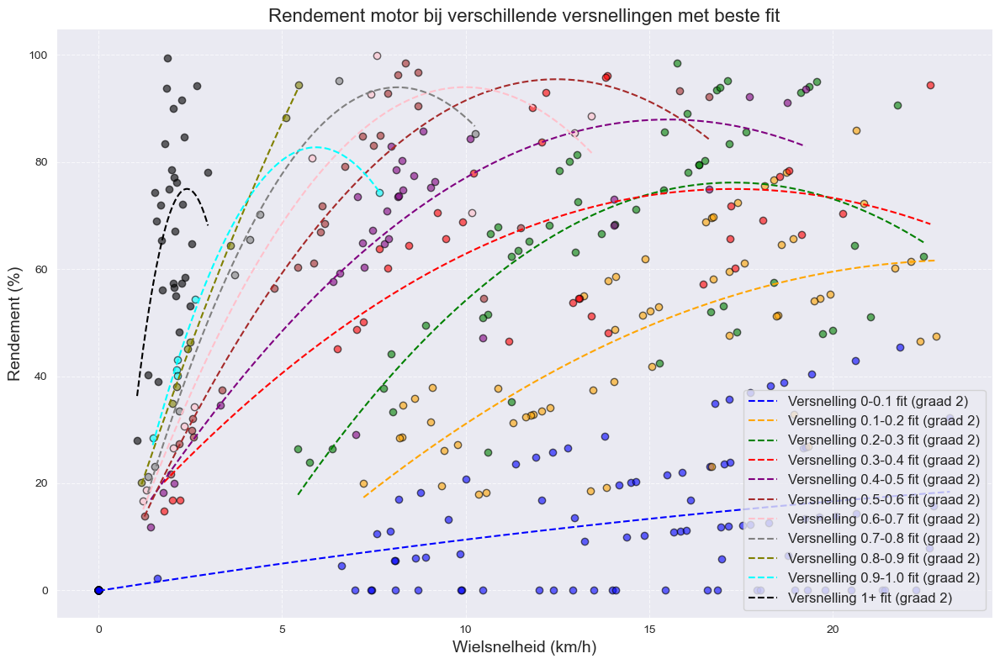

In [33]:
plt.figure(figsize=(12, 8))
for subset, label, color in subsets:
    plot_acceleration_data_with_fit_no_points_in_legend(subset, label, color, degree=2)

# Plotinstellingen
plt.title('Rendement motor bij verschillende versnellingen met beste fit', fontsize=16)
plt.xlabel('Wielsnelheid (km/h)', fontsize=14)
plt.ylabel('Rendement (%)', fontsize=14)
plt.grid(visible=True, linestyle='--', alpha=0.7)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()


In [54]:

def plot_a_data_with_fit_no_points_in_legend(dataframe, label, color, degree=2):
    if dataframe.empty:
        return  # Sla lege dataframes over
    # Plot de punten zonder ze aan de legenda toe te voegen
    plt.scatter(dataframe['GPS speed, in km/h'], dataframe['Rendement motor (bij Wiel) (%)'],
                alpha=0.6, edgecolors='k', color=color)
    # Bereken de beste fit
    if len(dataframe) > degree:  # Zorg dat er genoeg data is voor een polynoom fit
        coefficients = np.polyfit(dataframe['GPS speed, in km/h'], dataframe['Rendement motor (bij Wiel) (%)'], degree)
        polynomial = np.poly1d(coefficients)
        x_vals = np.linspace(dataframe['GPS speed, in km/h'].min(), dataframe['GPS speed, in km/h'].max(), 500)
        y_vals = polynomial(x_vals)
        # Voeg alleen de trendlijn toe aan de legenda
        plt.plot(x_vals, y_vals, linestyle='--', color=color, label=f'{label} fit (graad {degree})')

In [22]:
def rendement_motordriver_plotly2(dataframe, polynoom_graad):
    """
    Visualiseert de relatie tussen versnelling en rendement met een polynoom fit in Plotly.

    Parameters:
    dataframe (pd.DataFrame): DataFrame met de kolommen 'Versnelling (m/s^2)' en 'Rendement (bij GPS verandering) (%)'.

    polynoom_graad (int): De graad van de polynoom die aan de data wordt aangepast.

    Returns:
    plotly.graph_objects.Figure: De interactieve Plotly-figuur.
    """
    # Filter de data: verwijder rijen met versnelling boven 2 m/s^2
    dataframe = dataframe[dataframe['Versnelling (m/s^2)'] <= 1.5]

    # Extractie van de benodigde data
    x = dataframe['Wielsnelheid, in km/h']
    y = dataframe['Rendement motor (bij Wiel) (%)']

    # Berekening van de polynoomfit (beste fit door alle punten)
    coefficients = np.polyfit(x, y, polynoom_graad)
    polynomial = np.poly1d(coefficients)

    # Genereer waardes voor een vloeiende curve
    x_smooth = np.linspace(min(x), max(x), 500)
    y_smooth = polynomial(x_smooth)

    # Bereken de fit vergelijking
    fit_equation = "y = " + " + ".join(
        [f"{coef:.2e}x^{polynoom_graad - i}" if polynoom_graad - i > 0 else f"{coef:.2e}" for i, coef in enumerate(coefficients)]
    )

    # Maak een go.Figure op basis van px.scatter
    scatter_fig = px.scatter(
        dataframe,
        x='Wielsnelheid, in km/h',
        y='Rendement motor (bij Wiel) (%)',
        color='Versnelling (m/s^2)',  # Gebruik GPS snelheid voor de colorbar
        color_continuous_scale='Viridis',  # Kies een kleurenkaart voor de colorbar
        hover_data={
            'Versnelling (m/s^2)': True,
            'Rendement motor (bij Wiel) (%)': True,
            'index': True,  # Rij-index
            'Wielsnelheid, in km/h': True
        },
        title='Rendement motor vs. Versnelling (H2A Test p2 2022)',
        labels={
            'Versnelling (m/s^2)': 'Versnelling (m/s^2)',
            'Rendement motor (bij Wiel) (%)': 'Rendement (%)',
            'Wielsnelheid, in km/h': 'Wiel Snelheid (km/h)'
        }
    ).update_traces(showlegend=False)  # Verberg legendes, aangezien een colorbar wordt gebruikt

    # Voeg de polynoomfit toe
    scatter_fig.add_trace(
        go.Scatter(
            x=x_smooth,
            y=y_smooth,
            mode='lines',
            name=f'Polynoom fit (graad {polynoom_graad})',
            line=dict(color='red', width=2),
            hoverinfo='skip'
        )
    )

    # Voeg polynoomvergelijking toe aan de layout
    scatter_fig.add_annotation(
        x=0.05 * (max(x) - min(x)) + min(x),
        y=0.85 * (max(y) - min(y)) + min(y),
        text=fit_equation,
        showarrow=False,
        font=dict(size=12, color='red'),
        align='left',
        bgcolor='white',
        opacity=0.8
    )

    # Verwijder expliciete .show()
    return scatter_fig

# Aanroep van de functie met de gefilterde dataset
fig = rendement_motordriver_plotly2(filtered_df, 1)
fig.show()  # Roep expliciet fig.show() alleen buiten de functie aan


In [16]:
def rendement_vs_versnelling_plotly(dataframe, polynoom_graad):
    """
    Visualiseert de relatie tussen versnelling en rendement met een polynoom fit in Plotly.

    Parameters:
    dataframe (pd.DataFrame): DataFrame met de kolommen 'Versnelling (m/s^2)' en 'Rendement (bij GPS verandering) (%)'.
    polynoom_graad (int): De graad van de polynoom die aan de data wordt aangepast.

    Returns:
    plotly.graph_objects.Figure: De interactieve Plotly-figuur.
    """
    # Extractie van de benodigde data
    x = dataframe['Versnelling (m/s^2)']
    y = dataframe['Rendement motor (bij GPS verandering) (%)']

    # Berekening van de polynoomfit (beste fit door alle punten)
    coefficients = np.polyfit(x, y, polynoom_graad)
    polynomial = np.poly1d(coefficients)

    # Genereer waardes voor een vloeiende curve
    x_smooth = np.linspace(min(x), max(x), 500)
    y_smooth = polynomial(x_smooth)

    # Bereken de fit vergelijking
    fit_equation = "y = " + " + ".join(
        [f"{coef:.2e}x^{polynoom_graad - i}" if polynoom_graad - i > 0 else f"{coef:.2e}" for i, coef in enumerate(coefficients)]
    )

    # Maak een go.Figure op basis van px.scatter
    scatter_fig = px.scatter(
        dataframe,
        x='Versnelling (m/s^2)',
        y='Rendement motor (bij GPS verandering) (%)',
        color='Cluster',  # Cluster gebruiken voor kleur als aanwezig
        hover_data={
            'Versnelling (m/s^2)': True,
            'Rendement motor (bij GPS verandering) (%)': True,
            'index': True,  # Rij-index
        },
        title='Rendement vs. Versnelling (H2A Test p2 2022)',
        labels={
            'Versnelling (m/s^2)': 'Versnelling (m/s^2)',
            'Rendement motor (bij GPS verandering) (%)': 'Rendement (%)'
        }
    ).update_traces(showlegend=True)  # Zorgt dat er geen dubbele legendes verschijnen

    # Voeg de polynoomfit toe
    scatter_fig.add_trace(
        go.Scatter(
            x=x_smooth,
            y=y_smooth,
            mode='lines',
            name=f'Polynoom fit (graad {polynoom_graad})',
            line=dict(color='red', width=2),
            hoverinfo='skip'
        )
    )

    # Voeg polynoomvergelijking toe aan de layout
    scatter_fig.add_annotation(
        x=0.05 * (max(x) - min(x)) + min(x),
        y=0.85 * (max(y) - min(y)) + min(y),
        text=fit_equation,
        showarrow=False,
        font=dict(size=12, color='red'),
        align='left',
        bgcolor='white',
        opacity=0.8
    )

    # Verwijder expliciete .show()
    return scatter_fig

# Aanroep van de functie met de gefilterde dataset
fig = rendement_vs_versnelling_plotly(filtered_df, 2)
fig.show()  # Roep expliciet fig.show() alleen buiten de functie aan


In [15]:
def rendement_vs_snelheid_plotly(dataframe, polynoom_graad):
    """
    Visualiseert de relatie tussen versnelling en rendement met een colorbar in Plotly.

    Parameters:
    dataframe (pd.DataFrame): DataFrame met de kolommen 'Versnelling (m/s^2)' en 'Rendement (bij GPS verandering) (%)'.

    polynoom_graad (int): De graad van de polynoom die aan de data wordt aangepast.

    Returns:
    plotly.graph_objects.Figure: De interactieve Plotly-figuur.
    """
    # Extractie van de benodigde data
    x = dataframe['GPS speed, in km/h']
    y = dataframe['Rendement motor (bij GPS verandering) (%)']

    # Maak een go.Figure op basis van px.scatter
    scatter_fig = px.scatter(
        dataframe,
        x='GPS speed, in km/h',
        y='Rendement motor (bij GPS verandering) (%)',
        color='Versnelling (m/s^2)',  # Gebruik GPS snelheid voor de colorbar
        color_continuous_scale='Viridis',  # Kies een kleurenkaart voor de colorbar
        hover_data={
            'Versnelling (m/s^2)': True,
            'Rendement motor (bij GPS verandering) (%)': True,
            'index': True,  # Rij-index
            'GPS speed, in km/h': True
        },
        title='Rendement vs. Versnelling (H2A Test p2 2022)',
        labels={
            'Versnelling (m/s^2)': 'Versnelling (m/s^2)',
            'Rendement motor (bij GPS verandering) (%)': 'Rendement (%)',
            'GPS speed, in km/h': 'GPS Snelheid (km/h)'
        }
    ).update_traces(showlegend=False)  # Verberg legendes, aangezien een colorbar wordt gebruikt

    # Verwijder expliciete .show()
    return scatter_fig

# Aanroep van de functie met de gefilterde dataset
fig = rendement_vs_snelheid_plotly(filtered_df, 2)
fig.show()  # Roep expliciet fig.show() alleen buiten de functie aan


In [9]:
filtered_df

,level_0,index,Datalogger port,"Dataloggertijd, in s",Format header (>03|04),Tijd sinds laatste herstart motordriver (s),Spanning over de motor (V),Stroom door de motor (A),Vermogen geleverd aan de motor (W),Energie geleverd aan de motor sinds reset (J),...,"Wielsnelheid, in m/s","GPS speed, in m/s",Kinetische energie (GPS) (J),Delta energie geleverd,GPS_snelheid_veranderd,Versnelling (m/s^2),Delta energie geleverd (bij GPS verandering),Delta kinetische energie (GPS),Rendement (bij GPS verandering) (%),Cluster
121,13242,13242,3,1392.9820,03|04,67.9064,6.223,11.028,80.3,630,...,1.670000,1.444444,93.888889,1.0,True,0.773837,73.0,70.416667,96.461187,Terugweg
258,13379,13379,3,1394.0612,03|04,68.9854,7.153,11.088,90.6,719,...,1.736389,1.638889,120.868056,1.0,True,0.180175,89.0,26.979167,30.313670,Terugweg
375,13496,13496,3,1394.9828,03|04,69.9068,6.810,11.111,86.3,798,...,1.872500,1.805556,146.701389,1.0,True,0.180845,79.0,25.833333,32.700422,Terugweg
493,13614,13614,3,1395.9133,03|04,70.8372,5.595,10.422,63.7,878,...,2.064444,1.916667,165.312500,0.0,True,0.119410,80.0,18.611111,23.263889,Terugweg
629,13750,13750,3,1396.9854,03|04,71.9090,9.896,11.224,124.3,977,...,1.968889,1.944444,170.138889,1.0,True,0.025910,99.0,4.826389,4.875140,Terugweg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54227,114344,114344,3,2236.0701,03|04,910.8454,12.312,9.857,132.0,47094,...,4.103333,3.972222,710.034722,1.0,True,0.051421,143.0,19.722222,13.791764,Terugweg
54444,114561,114561,3,2237.9297,03|04,912.7046,13.806,9.679,145.1,47345,...,4.296111,4.055556,740.138889,1.0,True,0.208162,126.0,69.270833,54.976852,Terugweg
54572,114689,114689,3,2239.0102,03|04,913.7848,8.159,0.056,0.5,47387,...,4.076111,4.111111,760.555556,0.0,True,0.051417,42.0,20.416667,48.611111,Terugweg
55872,115989,115989,3,2249.9461,03|04,924.7190,8.261,9.909,94.7,47952,...,2.514167,2.527778,287.534722,1.0,True,0.153847,191.0,65.312500,34.195026,Terugweg


In [28]:
test = filtered_df.iloc[58:68]
test

,level_0,index,Datalogger port,"Dataloggertijd, in s",Format header (>03|04),Tijd sinds laatste herstart motordriver (s),Spanning over de motor (V),Stroom door de motor (A),Vermogen geleverd aan de motor (W),Energie geleverd aan de motor sinds reset (J),...,Delta energie geleverd,GPS_snelheid_veranderd,Versnelling (m/s^2),Delta energie geleverd (bij GPS verandering),Delta kinetische energie (GPS),Rendement (bij GPS verandering) (%),Rendement motor (bij GPS verandering) (%),Delta energie geleverd motordriver (bij GPS verandering),Rendement motordriver (bij GPS verandering) (%),Cluster
12422,34142,34142,3,1565.0163,03|04,239.9104,9.277,10.724,111.3,17060,...,2.0,True,0.051902,112.0,11.388889,10.168651,10.168651,115.0,97.391304,Heenweg
12533,34253,34253,3,1565.9407,03|04,240.8346,9.214,10.586,109.6,17160,...,1.0,True,0.060099,100.0,11.666667,11.666667,11.666667,108.0,92.592593,Heenweg
12661,34381,34381,3,1567.0131,03|04,241.9068,9.896,10.481,115.1,17286,...,1.0,True,0.492146,126.0,124.687500,98.958333,98.958333,130.0,96.923077,Heenweg
12897,34617,34617,3,1569.0048,03|04,243.8982,11.423,10.174,128.5,17529,...,1.0,True,0.182852,133.0,51.284722,38.559942,38.559942,139.0,95.683453,Heenweg
13006,34726,34726,3,1569.9248,03|04,244.8180,11.761,10.131,132.1,17647,...,1.0,True,0.301932,118.0,79.166667,67.090395,67.090395,122.0,96.721311,Heenweg
13133,34853,34853,3,1570.9954,03|04,245.8884,12.169,10.008,133.5,17787,...,1.0,True,0.129730,140.0,42.187500,30.133929,30.133929,145.0,96.551724,Heenweg
13243,34963,34963,3,1571.9195,03|04,246.8124,12.529,9.894,135.5,17909,...,1.0,True,0.270533,122.0,80.312500,65.829918,65.829918,126.0,96.825397,Heenweg
13498,35218,35218,3,1574.0607,03|04,248.9532,13.339,9.701,142.1,18197,...,2.0,True,0.232601,146.0,81.562500,55.864726,55.864726,152.0,96.052632,Heenweg
13608,35328,35328,3,1574.9843,03|04,249.8766,12.973,9.623,136.0,18324,...,1.0,True,0.240604,127.0,77.222222,60.804899,60.804899,131.0,96.946565,Heenweg
13849,35569,35569,3,1576.9973,03|04,251.8894,9.386,0.060,0.6,18536,...,0.0,True,0.179390,212.0,134.965278,63.662867,63.662867,219.0,96.803653,Heenweg


In [18]:
# Maak een dataframe met coördinaten


df = pd.DataFrame(test)
# Voeg de rij-index expliciet toe als kolom
# Maak een scattermapbox met Plotly
fig = px.scatter_mapbox(
    df, 
    lat="GPS latitude, in graden", 
    lon="GPS longitude, in graden", 
    zoom=15,  # Zoomniveau van de kaart
    height=800,
    hover_data={
        'index': True,  # Rij-index
        'Energie geleverd aan de motor sinds reset (J)': True,  # Geleverde energie
        'GPS speed, in km/h': True,
        },
    title="Weergave van coördinaten"
)

# Stel de stijl van de kaart in (bijv. open-street-map)
fig.update_layout(mapbox_style="open-street-map")

# Toon de kaart
fig.show()

In [62]:
# Maak de Plotly scatterplot
fig = px.scatter_mapbox(
    combined_df, 
    lat="GPS latitude, in graden", 
    lon="GPS longitude, in graden",
    color='Cluster',
    zoom=15,  # Zoomniveau van de kaart
    height=800,
    hover_data={
        'index': True,  # Rij-index
        'Energie geleverd aan de motor sinds reset (J)': True,  # Geleverde energie
    },
    title="Weergave van coördinaten"
)

# Stel de stijl van de kaart in (bijv. open-street-map)
fig.update_layout(mapbox_style="open-street-map")

# Toon de kaart
fig.show()

In [ ]:
"""
    Maakt een interactieve scatterplot van GPS-coördinaten met kleuren die afhankelijk zijn van het geleverde vermogen.
    Optioneel kunnen aangepaste punten worden toegevoegd.

    Parameters:
    df (pd.DataFrame): DataFrame met de kolommen 'GPS longitude, in graden', 'GPS latitude, in graden' en 'Vermogen geleverd aan de motor (W)'.
    custom_points (list of tuples, optional): Lijst met tuples met (longitude, latitude) coördinaten voor extra punten. Standaard is None.

    Returns:
    Geel = geen vermogen
    Blauw = Wel vermogen
    Rood = Zelf ingevoerde punten
    """
custom_points = []
# Aanroepen van de functie met aangepaste punten
lib.plot_gps_power(df_r, custom_points=custom_points)

# lib.plot_height_profile(df_r1['GPS latitude, in graden'], df_r1['GPS longitude, in graden'], df_r1['GPS speed, in km/h'])

# Toon de kaart
fig.show()